# Callbacks

Callbacks in the context of this package are user-defined functions that execute after a object detection model finishes running inference (or during other specific events). They let you process the detection results, save them to a database, or do any other post-processing automatically. Their advantage is that they can be used to decouple the model from the rest of the code, making it easier to maintain and extend. It makes it simple to select specific functionality for a specific task, and to add new functionality without modifying the core code.

This notebook demonstrates how to use callbacks in the context of the ct_detector package. The package provides a set of built-in callbacks, and you can also define your own custom callbacks. The most practical callbacks are shown in action and a brif tutorial on making your own callback is provided.

# Predict callbacks

Callbacks are especially important during the prediction process. Obviously, we always use the model to generate prediction on a set of images, and we want to do something with the results. For example, you may wish to save the results to a database, or plot the results for quick feedback on the model performance. The package already includes a set of callbacks tailored for analyzing elephant camera trap data, but you can also define your own callbacks.

We can define which callback functions to run in different stages of the prediction process, for example, we may want to print some summary of images to analyze before the prediction and then summarize the results after the prediction. Below is an example of how to do this.

## Basic example

In [ ]:
# We import the default callback dictionary with keys for each step of the process.
from ultralytics.utils.callbacks import default_callbacks

# You can see the available keys of the default callbacks each specifying functions to be called at that stage of the process.
print("Available callback keys:")
for key in default_callbacks.keys():
    print(f"- {key}")

# Only a subset of keys is applicable for predictions but the dictionary should contain all keys
print("Prediction relevant callback keys:")
for key in default_callbacks.keys():
    if "predict" in key:
        print(f"- {key}")

In [ ]:
# Now we can import a simple callback function that will plot the results of the prediction
from ct_detector.callbacks.base import display_results

# Before we assign any callbacks, we will copy the default callbacks dictionary to avoid modifying the original one.
predictor_callbacks = default_callbacks.copy()

# We want this function to be called after the prediction is finished, so we can assign it to the 'on_predict_batch_end' key of the callbacks dictionary. Each key is assigned a lsit of callback functions, so there may be more than one function assigned to the same key.
predictor_callbacks['on_predict_batch_end'] = [display_results]

In [ ]:
# Now we can run the model like we are used to, only this time we will assign the callbacks to the predictor. The callbacks will be called at the appropriate times during the prediction process.
import os
from ultralytics import YOLO
from ct_detector.model.predict import CtPredictor
from ct_detector.model import MODELS, DATASETS, DATASETS_DIR

# Load a model
model_path = MODELS['eie_t_1_yolov8m']  # or your custom model: 'path/to/best.pt'

# Get a dataset
data_path = os.path.join(DATASETS_DIR, "1", "val.txt")  # or your dataset .yaml or folder of images

# Prepare the predictor and set up its parameters including the callbacks
analysis_pred = CtPredictor(
    overrides={
        "conf": 0.3,      # confidence threshold
        "save": False,    # don't save annotated images
        "save_txt": False, # no label files
        "verbose": False # no verbose output
    },
    _callbacks=predictor_callbacks # Here we pass the entire callbacks dictionary.
)

# Load the model and assign the predictor
model = YOLO(model_path)
model.predictor = analysis_pred

# Alternatively we assign the callbacks to the predictor after loading the model
# model.predictor.callbacks = predictor_callbacks

# Now run predictions on a folder or an image. Stream =False is used to get results at once in a form of a list of Results. They are stored in memory and can be accessed via the predictor.results attribute. However, this is not recommended for large datasets.
results = model.predict(data_path, stream=False)

# results is a list of Results. Let's just show five
for r in results:
    print(f"Image: {os.path.basename(r.path)}, #boxes={len(r.boxes)}")

## Save results to a database

In most cases once we analyze the images we wil lwant to log the results to a database. The package provides tailored support for the analysis of the elephant camera trap data, but you can also define your own callbacks to save the results to a database of your choice. To make the database informative we extract various data from the results:

- image_id (text) => Path to the image
- num_elephants (int) => Number of elephants in the image
- num_calves (int) => Number of calves in the image
- elephant_ids (text) => IDs of elephant individuals in the image (if tracking is enabled)
- calf_ids (text) => IDs of calf individuals in the image (if tracking is enabled)
- num_individuals (int) => Number of identified individuals in the image
- ears_visible (int) => Number of ears visible
- tusks_visible (int) => Number of tusks visible
- boxes_data (text) => JSON array of [x1,y1,x2,y2,conf,cls] for each prediction box
- conf_values (text) => JSON array of confidences for each prediction box
- max_ear_diagonal (float) => The size of the diagonal of the largest ear. Used as proxy to determine the degree of visibility of the ear.
- max_tusk_diagonal (float) => The size of the diagonal of the largest tusk. Used as proxy to determine the degree of visibility of the tusk. Tusks are varied in size, though.
- max_elephant_diagonal_for_largest_ear (float) => The size of the diagonal of the elephant box overlaping with the largest ear.
- max_elephant_diagonal_for_largest_tusk (float) => The size of the diagonal of the elephant box overlaping with the largest tusk.
- ear_to_body_ratio (float) => The ratio of the size of the largest ear to the size of the elephant box overlapping with it. Proxy for the degree of visibility of the ear. Not dependant on the size of the elephant and the closeness to camera. Higher values mean an image suitable for individual identification.
- tusk_to_body_ratio (float) => The ratio of the size of the largest tusk to the size of the elephant box overlapping with it. Proxy for the degree of visibility of the tusk. Tusks are of different sizes, so this is much less informative than the ear proxy. Higher values mean an image suitable for individual identification.
- time_of_day (text) => Unused, can be filled in manually or programatically fro metadata.
- location (text) => Unused, can be filled in manually or programatically fro metadata.
- camera_id (text) => Unused, can be filled in manually or programatically fro metadata.

The database is generated in SQLite format but this can be easily converted to other formats. SQLite can be easily queried using SQL commands and is a good choice for subsequent analysis in python or R. Converting the database to Excel is discussed elsewhere.

In [ ]:
# We import the default callback dictionary with keys for each step of the process.
from ultralytics.utils.callbacks import default_callbacks

In [ ]:
# We will import callbacks for printing the extracted data into the console for quick reference, for logging the data into the database, and the default class map that specifies the class names and its numbers in the model.
from ct_detector.callbacks.database import print_prediction_data, log_prediction_data_into_sqlite, CLASS_MAP

# The class map is a simple dictionary which can be constructed or modified from the default one.
print("Class map:")
for k, v in CLASS_MAP.items():
    print(f"- {k}: {v}")

# We first have to set up the callback function with path to the database and the table name. The database is created if it does not exist. We must pass the class map.
db_callback = log_prediction_data_into_sqlite(db_path="elephants.sqlite", table_name="elephant_data", class_map=CLASS_MAP)

# Before we assign any callbacks, we will copy the default callbacks dictionary to avoid modifying the original one.
predictor_callbacks = default_callbacks.copy()

# We want this function to be called after the prediction is finished. We can assign the print_prediction_data function directly without setup and we also assign the set up db_callback.
predictor_callbacks['on_predict_batch_end'] = [print_prediction_data, db_callback]

In [ ]:
# Now we can run the model like we are used to, and we will remember to assign the callbacks to the predictor.
import os
from ultralytics import YOLO
from ct_detector.model.predict import CtPredictor
from ct_detector.model import MODELS, DATASETS, DATASETS_DIR

# Load a model
model_path = MODELS['eie_t_1_yolov8m']  # or your custom model: 'path/to/best.pt'

# Get a dataset
data_path = os.path.join(DATASETS_DIR, "1", "val.txt")  # or your dataset .yaml or folder of images

# Prepare the predictor and set up its parameters including the callbacks
analysis_pred = CtPredictor(
    overrides={
        "conf": 0.3,      # confidence threshold
        "save": False,    # don't save annotated images
        "save_txt": False, # no label files
        "verbose": False # no verbose output
    },
    _callbacks=predictor_callbacks # Here we pass the entire callbacks dictionary.
)

# Load the model and assign the predictor
model = YOLO(model_path)
model.predictor = analysis_pred

# Now run predictions on a folder or an image.
results = model.predict(data_path, stream=False)

# results is a generator, we unpack it to get the results. The generator yields results one by one, so we can process them as they come in.
for r in results:
    pass

## Create mosaic of the results

In order to quickly analyze the results and have a reference of the relevant detected object, for example, ears and tusks for individual elephant identification and comparison, we can create a mosaic of the results. The mosaic is a grid of images with the detected objects highlighted. The mosaic is saved to disk. For elephants we can create the following mosaics:

- Ears detected => The images with the detected ears are saved to a grid. The grid is saved to disk.
- Tusks detected => The images with the detected tusks are saved to a grid. The grid is saved to disk.
- Elephants detected => The images with the detected elephants and calves are saved to a grid. The grid is saved to disk.

We can choose the desired size of the mosaic grid, and we can define padding around the object of interest that will be included in the mosaic to ensure they are clearly visible and not cropped around the edges.

In [1]:
# We import the default callback dictionary with keys for each step of the process.
from ultralytics.utils.callbacks import default_callbacks

In [2]:
# We will import the callback for constructing the mosaics.
from ct_detector.callbacks.images import save_cls_mosaic

# We will also need the class map. But we can create our own.
CLASS_MAP = {
    "calf": 0,
    "ear": 1,
    "elephant": 2,
    "tusk": 3
}

# We first have to set up the callback function with the output path. The mosaic size and padding are optional. The class map is required.
mosaic_callback = save_cls_mosaic(output_dir="mosaic_output", mosaic_size=640, padding=10, class_map=CLASS_MAP)

# Before we assign any callbacks, we will copy the default callbacks dictionary to avoid modifying the original one.
predictor_callbacks = default_callbacks.copy()

# We want this function to be called after the prediction is finished.
predictor_callbacks['on_predict_batch_end'] = [mosaic_callback]

In [3]:
# Now we can run the model like we are used to, and we will remember to assign the callbacks to the predictor.
import os
from ultralytics import YOLO
from ct_detector.model.predict import CtPredictor
from ct_detector.model import MODELS, DATASETS, DATASETS_DIR

# Load a model
model_path = MODELS['eie_t_1_yolov8m']  # or your custom model: 'path/to/best.pt'

# Get a dataset
data_path = os.path.join(DATASETS_DIR, "1", "val.txt")  # or your dataset .yaml or folder of images

# Prepare the predictor and set up its parameters including the callbacks
analysis_pred = CtPredictor(
    overrides={
        "conf": 0.3,      # confidence threshold
        "save": False,    # don't save annotated images
        "save_txt": False, # no label files
        "verbose": False # no verbose output
    },
    _callbacks=predictor_callbacks # Here we pass the entire callbacks dictionary.
)

# Load the model and assign the predictor
model = YOLO(model_path)
model.predictor = analysis_pred

# Now run predictions on a folder or an image.
results = model.predict(data_path, stream=True)

# results is a generator, we unpack it to get the results. The generator yields results one by one, so we can process them as they come in.
for r in results:
    pass

Ultralytics 8.3.101  Python-3.11.3 torch-2.6.0+cpu CPU (Intel Core(TM) i7-4790K 4.00GHz)
Model summary (fused): 92 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs


## Writing your own callback

You can of course write your own callback functions to meet your specific requirements. Its very easy as the package provides support and a clear template for writing your own callbacks. The function can be defined directly in your jupyter notebook and passed to the predictor.

1) Define a function that takes results: List[Results] as its only argument.
2) Decorate it with @predict_callback.
3) Implement whatever post-processing you need.

For example, we will write a function that prints the confidence values of all prediction boxes.

In [ ]:
# First import the decorator that will register the function as a callback.
from ct_detector.callbacks.base import predict_callback

In [ ]:
# We will add the decorator to the function and we make sure that the function accepts results as the only argument.
@predict_callback
def print_confidences(results):
    # For each result in the list we will print the confidence values of the boxes
    for r in results:
        print(f"Image: {os.path.basename(r.path)}, No. of boxes={len(r.boxes)}")

        # For each bounding box, print its confidence
        if r.boxes is not None and len(r.boxes) > 0:
            for box in r.boxes.data.cpu().numpy():
                conf = box[4]
                print(f"Confidence: {conf:.2f}")
        else:
            print("No boxes detected.")

In [ ]:
# We import the default callback dictionary with keys for each step of the process.
from ultralytics.utils.callbacks import default_callbacks

# Before we assign any callbacks, we will copy the default callbacks dictionary to avoid modifying the original one.
predictor_callbacks = default_callbacks.copy()

# We want this function to be called after the prediction is finished.
predictor_callbacks['on_predict_batch_end'] = [print_confidences]

In [ ]:
# Now we can run the model like we are used to, and we will remember to assign the callbacks to the predictor.
import os
from ultralytics import YOLO
from ct_detector.model.predict import CtPredictor
from ct_detector.model import MODELS, DATASETS, DATASETS_DIR

# Load a model
model_path = MODELS['eie_t_1_yolov8m']  # or your custom model: 'path/to/best.pt'

# Get a dataset
data_path = os.path.join(DATASETS_DIR, "1", "val.txt")  # or your dataset .yaml or folder of images

# Prepare the predictor and set up its parameters including the callbacks
analysis_pred = CtPredictor(
    overrides={
        "conf": 0.3,      # confidence threshold
        "save": False,    # don't save annotated images
        "save_txt": False, # no label files
        "verbose": False # no verbose output
    },
    _callbacks=predictor_callbacks # Here we pass the entire callbacks dictionary.
)

# Load the model and assign the predictor
model = YOLO(model_path)
model.predictor = analysis_pred

# Now run predictions on a folder or an image.
results = model.predict(data_path, stream=True)

# results is a generator, we unpack it to get the results. The generator yields results one by one, so we can process them as they come in.
for r in results:
    pass

## Multi-model prediction with callbacks

You can also add post-processing callbacks when working with an ensemble of multiple models performing the predictions. Let's demonstrate it with a full on example. We will use a two-model ensemble and we will want to plot the result in the console, print the prediction data into the console and save it into a database. We will also create the mosaics of the results.

In [1]:
# We will import all the callbacks we need.
from ct_detector.callbacks.database import print_prediction_data, log_prediction_data_into_sqlite, CLASS_MAP
from ct_detector.callbacks.images import save_cls_mosaic
from ct_detector.callbacks.base import display_results

# We set up the callbacks that require it.
db_callback = log_prediction_data_into_sqlite(db_path="elephants.sqlite", table_name="elephant_data", class_map=CLASS_MAP)
mosaic_callback = save_cls_mosaic(output_dir="mosaic_output", mosaic_size=640, padding=10, class_map=CLASS_MAP)

# We prepare a list of all callbacks we want to use.
callbacks = [
    print_prediction_data,
    db_callback,
    mosaic_callback,
    display_results
]

Ultralytics 8.3.101  Python-3.11.3 torch-2.6.0+cpu CPU (Intel Core(TM) i7-4790K 4.00GHz)
Ultralytics 8.3.101  Python-3.11.3 torch-2.6.0+cpu CPU (Intel Core(TM) i7-4790K 4.00GHz)
Model summary (fused): 92 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs
YOLOv9m summary (fused): 151 layers, 20,015,884 parameters, 0 gradients, 76.5 GFLOPs
Detection boxes: [[    0.86902     0.28241         640       639.4     0.98886           2]
 [     426.77           0      534.86      72.255     0.32712           1]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 1.], dtype=torch.float64)
conf: tensor([0.9889, 0.3271], dtype=torch.float64)
data: tensor([[8.6902e-01, 2.8241e-01, 6.4000e+02, 6.3940e+02, 1.0000e+00, 9.8886e-01, 2.0000e+00],
        [4.2677e+02, 0.0000e+00, 5.3486e+02, 7.2255e+01, 2.0000e+00, 3.2712e-01, 1.0000e+00]], dtype=torch.float64)
id: tensor([1., 2.], dtype=torch.float64)
is_track: True
orig_shape: (640, 640)
shape: torch.Size([2, 7])
xywh: tensor

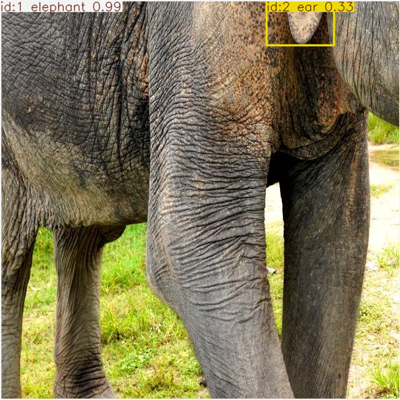

Detection boxes: [[     1.2103     0.54236      326.18         640     0.93894           2]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2.], dtype=torch.float64)
conf: tensor([0.9389], dtype=torch.float64)
data: tensor([[-14.0232,  -1.8558, 350.6505, 615.1204,   1.0000,   0.9389,   2.0000]], dtype=torch.float64)
id: tensor([1.], dtype=torch.float64)
is_track: True
orig_shape: (640, 640)
shape: torch.Size([1, 7])
xywh: tensor([[168.3136, 306.6323, 364.6736, 616.9762]])
xywhn: tensor([[0.2630, 0.4791, 0.5698, 0.9640]])
xyxy: tensor([[-14.0232,  -1.8558, 350.6505, 615.1204]], dtype=torch.float64)
xyxyn: tensor([[-0.0219, -0.0029,  0.5479,  0.9611]], dtype=torch.float64)


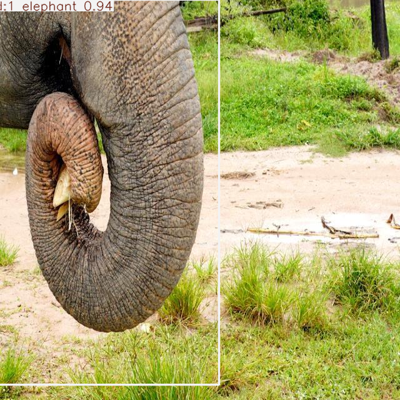

Detection boxes: [[    0.24738     0.27203      636.69      461.85     0.96715           2]
 [     462.35           0      590.08      35.712     0.38494           3]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 3.], dtype=torch.float64)
conf: tensor([0.9671, 0.3849], dtype=torch.float64)
data: tensor([[ 3.4817e+00, -2.0020e+00,  6.1380e+02,  5.3325e+02,  1.0000e+00,  9.6715e-01,  2.0000e+00],
        [ 4.6235e+02,  0.0000e+00,  5.9008e+02,  3.5712e+01, -1.0000e+00,  3.8494e-01,  3.0000e+00]], dtype=torch.float64)
id: tensor([ 1., -1.], dtype=torch.float64)
is_track: True
orig_shape: (640, 640)
shape: torch.Size([2, 7])
xywh: tensor([[308.6404, 265.6263, 610.3175, 535.2566],
        [526.2135,  17.8562, 127.7241,  35.7123]])
xywhn: tensor([[0.4823, 0.4150, 0.9536, 0.8363],
        [0.8222, 0.0279, 0.1996, 0.0558]])
xyxy: tensor([[  3.4817,  -2.0020, 613.7992, 533.2546],
        [462.3515,   0.0000, 590.0756,  35.7123]], dtype=torch.float64)
xyxyn: tensor(

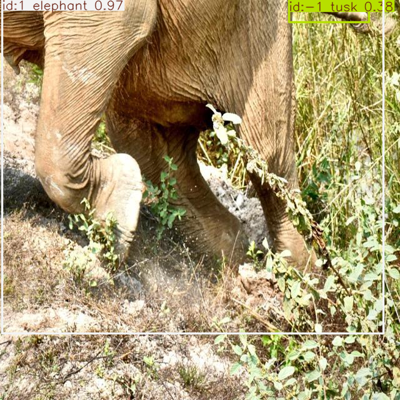

Detection boxes: [[     95.001      366.59         640         640     0.95395           2]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2.], dtype=torch.float64)
conf: tensor([0.9539], dtype=torch.float64)
data: tensor([[ 36.9528, 126.2686, 610.8833, 632.9698,   1.0000,   0.9539,   2.0000]], dtype=torch.float64)
id: tensor([1.], dtype=torch.float64)
is_track: True
orig_shape: (640, 640)
shape: torch.Size([1, 7])
xywh: tensor([[323.9181, 379.6192, 573.9305, 506.7012]])
xywhn: tensor([[0.5061, 0.5932, 0.8968, 0.7917]])
xyxy: tensor([[ 36.9528, 126.2686, 610.8833, 632.9698]], dtype=torch.float64)
xyxyn: tensor([[0.0577, 0.1973, 0.9545, 0.9890]], dtype=torch.float64)


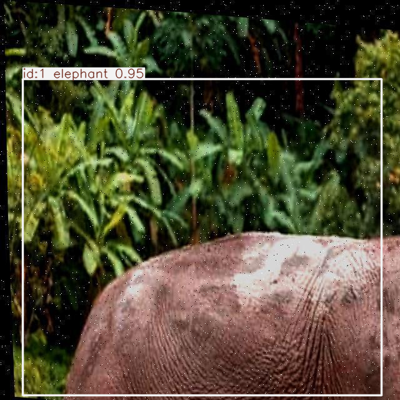

Detection boxes: [[    0.60199      7.5746      635.65      638.47     0.98848           2]]
No tracks
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2.])
conf: tensor([0.9885])
data: tensor([[6.0199e-01, 7.5746e+00, 6.3565e+02, 6.3847e+02, 9.8848e-01, 2.0000e+00]])
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([1, 6])
xywh: tensor([[318.1259, 323.0215, 635.0479, 630.8939]])
xywhn: tensor([[0.4971, 0.5047, 0.9923, 0.9858]])
xyxy: tensor([[6.0199e-01, 7.5746e+00, 6.3565e+02, 6.3847e+02]])
xyxyn: tensor([[9.4061e-04, 1.1835e-02, 9.9320e-01, 9.9761e-01]])


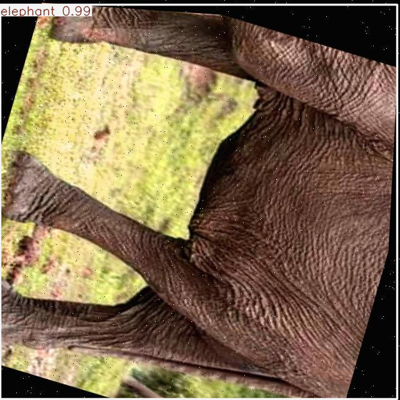

Detection boxes: [[     10.785      3.4948      328.73      594.78     0.96688           2]
 [     614.21      103.49         640      247.18     0.30556           2]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 2.], dtype=torch.float64)
conf: tensor([0.9669, 0.3056], dtype=torch.float64)
data: tensor([[-3.9068e+01,  5.8810e+00,  3.5777e+02,  6.1343e+02,  4.0000e+00,  9.6688e-01,  2.0000e+00],
        [ 6.1421e+02,  1.0349e+02,  6.4000e+02,  2.4718e+02, -1.0000e+00,  3.0556e-01,  2.0000e+00]], dtype=torch.float64)
id: tensor([ 4., -1.], dtype=torch.float64)
is_track: True
orig_shape: (640, 640)
shape: torch.Size([2, 7])
xywh: tensor([[159.3486, 309.6573, 396.8329, 607.5526],
        [627.1061, 175.3362,  25.7877, 143.6866]])
xywhn: tensor([[0.2490, 0.4838, 0.6201, 0.9493],
        [0.9799, 0.2740, 0.0403, 0.2245]])
xyxy: tensor([[-39.0678,   5.8810, 357.7651, 613.4336],
        [614.2123, 103.4929, 640.0000, 247.1794]], dtype=torch.float64)
xyxyn: tensor(

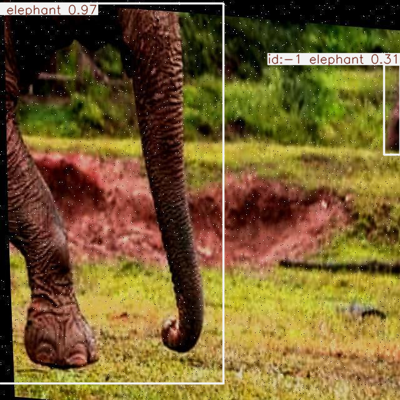

Detection boxes: [[     17.866      428.19      285.66      639.29     0.69065           1]
 [     14.194       426.3      301.01         640     0.62967           2]]
No tracks
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1., 2.])
conf: tensor([0.6906, 0.6297])
data: tensor([[1.7866e+01, 4.2819e+02, 2.8566e+02, 6.3929e+02, 6.9065e-01, 1.0000e+00],
        [1.4194e+01, 4.2630e+02, 3.0101e+02, 6.4000e+02, 6.2967e-01, 2.0000e+00]])
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([2, 6])
xywh: tensor([[151.7645, 533.7426, 267.7960, 211.0953],
        [157.6013, 533.1516, 286.8138, 213.6969]])
xywhn: tensor([[0.2371, 0.8340, 0.4184, 0.3298],
        [0.2463, 0.8330, 0.4481, 0.3339]])
xyxy: tensor([[ 17.8665, 428.1949, 285.6624, 639.2903],
        [ 14.1943, 426.3031, 301.0082, 640.0000]])
xyxyn: tensor([[0.0279, 0.6691, 0.4463, 0.9989],
        [0.0222, 0.6661, 0.4703, 1.0000]])


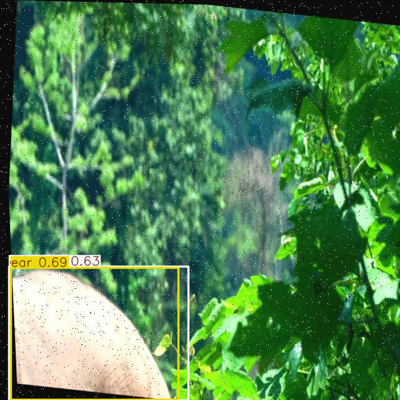

Detection boxes: [[     63.925     0.33917      156.63      206.39     0.95557           3]
 [          0           0      401.27      617.96     0.95257           2]
 [     295.45   0.0071793       396.7      92.845     0.93632           3]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([3., 2., 3.], dtype=torch.float64)
conf: tensor([0.9556, 0.9526, 0.9363], dtype=torch.float64)
data: tensor([[ 6.3925e+01,  3.3917e-01,  1.5663e+02,  2.0639e+02, -1.0000e+00,  9.5557e-01,  3.0000e+00],
        [-4.8150e+01,  4.3730e+00,  3.9304e+02,  6.1589e+02,  1.0000e+00,  9.5257e-01,  2.0000e+00],
        [ 2.9545e+02,  7.1793e-03,  3.9670e+02,  9.2845e+01, -1.0000e+00,  9.3632e-01,  3.0000e+00]], dtype=torch.float64)
id: tensor([-1.,  1., -1.], dtype=torch.float64)
is_track: True
orig_shape: (640, 640)
shape: torch.Size([3, 7])
xywh: tensor([[110.2761, 103.3652,  92.7014, 206.0520],
        [172.4466, 310.1293, 441.1941, 611.5126],
        [346.0747,  46.4262, 101.2411,  92

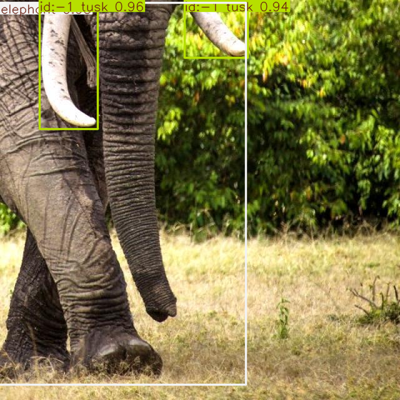

Detection boxes: [[     234.13      223.31      509.99      619.77       0.986           1]
 [          0      207.23      507.56      639.46     0.97442           2]
 [   0.012886      209.25        73.6      638.78      0.9093           1]
 [     72.585      615.39      115.33         640     0.40206           3]
 [     294.98      611.38      362.77      639.93     0.38487           3]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1., 2., 1., 3., 3.], dtype=torch.float64)
conf: tensor([0.9860, 0.9744, 0.9093, 0.4021, 0.3849], dtype=torch.float64)
data: tensor([[ 2.5369e+02,  2.5069e+02,  5.7501e+02,  6.3091e+02,  1.0000e+00,  9.8600e-01,  1.0000e+00],
        [ 1.3775e+00,  1.9782e+02,  5.0582e+02,  6.3390e+02,  4.0000e+00,  9.7442e-01,  2.0000e+00],
        [ 1.2886e-02,  2.0925e+02,  7.3600e+01,  6.3878e+02, -1.0000e+00,  9.0930e-01,  1.0000e+00],
        [ 7.2585e+01,  6.1539e+02,  1.1533e+02,  6.4000e+02, -1.0000e+00,  4.0206e-01,  3.0000e+00],
        

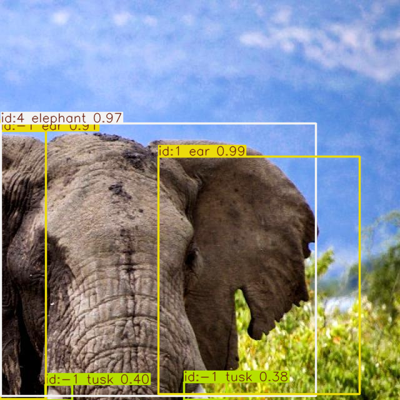

Detection boxes: [[     171.23      2.8638      533.28      626.65     0.97728           2]
 [     259.64      6.7311      382.29      262.29     0.95699           1]
 [     140.35      417.71      280.49      620.44     0.94976           0]
 [     171.27      267.36      212.92       328.6     0.91831           3]
 [     213.14      422.99      249.11      510.55     0.89274           1]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 1., 0., 3., 1.], dtype=torch.float64)
conf: tensor([0.9773, 0.9570, 0.9498, 0.9183, 0.8927], dtype=torch.float64)
data: tensor([[ 85.1796,  15.8686, 524.2870, 608.8132,   4.0000,   0.9773,   2.0000],
        [259.6359,   6.7311, 382.2856, 262.2930,  -1.0000,   0.9570,   1.0000],
        [140.3454, 417.7075, 280.4869, 620.4429,  -1.0000,   0.9498,   0.0000],
        [171.2730, 267.3623, 212.9180, 328.5974,  -1.0000,   0.9183,   3.0000],
        [213.1366, 422.9932, 249.1129, 510.5492,  -1.0000,   0.8927,   1.0000]], dtype=torch

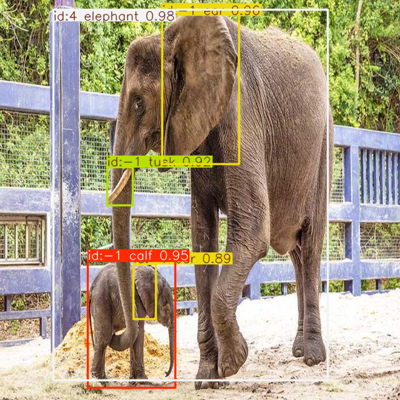

Detection boxes: [[     226.87         140      289.53      231.67     0.89164           1]
 [     297.86       230.2      322.87      273.77     0.86492           3]
 [     172.56      137.38       391.4      314.04     0.67027           2]]
No tracks
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1., 3., 2.])
conf: tensor([0.8916, 0.8649, 0.6703])
data: tensor([[226.8732, 139.9971, 289.5289, 231.6694,   0.8916,   1.0000],
        [297.8630, 230.1992, 322.8661, 273.7667,   0.8649,   3.0000],
        [172.5554, 137.3824, 391.3980, 314.0410,   0.6703,   2.0000]])
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([3, 6])
xywh: tensor([[258.2010, 185.8332,  62.6557,  91.6723],
        [310.3646, 251.9830,  25.0032,  43.5675],
        [281.9767, 225.7117, 218.8427, 176.6585]])
xywhn: tensor([[0.4034, 0.2904, 0.0979, 0.1432],
        [0.4849, 0.3937, 0.0391, 0.0681],
        [0.4406, 0.3527, 0.3419, 0.2760]])
xyxy: tensor([[226.8732, 139.9971, 289.528

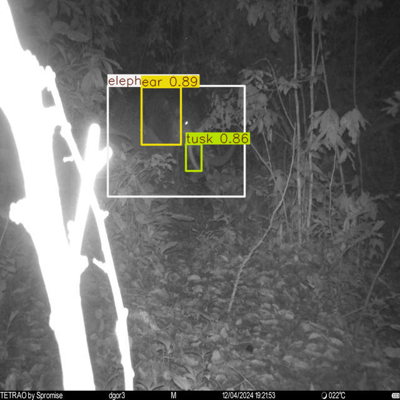

Detection boxes: [[     220.47      119.47      352.84      370.54     0.95217           2]
 [     301.76      241.72      315.26      293.92      0.8342           3]
 [     332.13      245.61      342.92      293.34     0.77674           3]
 [     260.89      123.88      305.01      232.76      0.6013           1]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 3., 3., 1.], dtype=torch.float64)
conf: tensor([0.9522, 0.8342, 0.7767, 0.6013], dtype=torch.float64)
data: tensor([[210.8639, 123.0373, 360.5404, 359.2279,  19.0000,   0.9522,   2.0000],
        [301.7592, 241.7218, 315.2567, 293.9177,  -1.0000,   0.8342,   3.0000],
        [332.1273, 245.6142, 342.9225, 293.3376,  -1.0000,   0.7767,   3.0000],
        [260.8944, 123.8757, 305.0125, 232.7645,  -1.0000,   0.6013,   1.0000]], dtype=torch.float64)
id: tensor([19., -1., -1., -1.], dtype=torch.float64)
is_track: True
orig_shape: (640, 640)
shape: torch.Size([4, 7])
xywh: tensor([[285.7021, 241.1326, 149.

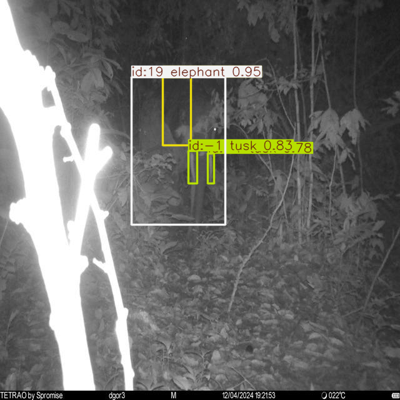

Detection boxes: [[     236.05      61.706      415.16      502.79     0.95692           2]
 [     240.39      63.034      341.02      228.55     0.92958           1]
 [     345.36      234.99      378.28      322.64     0.90322           3]
 [     399.18      281.49      414.06      321.52     0.40118           3]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 1., 3., 3.], dtype=torch.float64)
conf: tensor([0.9569, 0.9296, 0.9032, 0.4012], dtype=torch.float64)
data: tensor([[ 2.3252e+02,  8.0107e+01,  4.0746e+02,  4.5956e+02,  1.9000e+01,  9.5692e-01,  2.0000e+00],
        [ 2.4039e+02,  6.3034e+01,  3.4102e+02,  2.2855e+02, -1.0000e+00,  9.2958e-01,  1.0000e+00],
        [ 3.4536e+02,  2.3499e+02,  3.7828e+02,  3.2264e+02, -1.0000e+00,  9.0322e-01,  3.0000e+00],
        [ 3.9918e+02,  2.8149e+02,  4.1406e+02,  3.2152e+02, -1.0000e+00,  4.0118e-01,  3.0000e+00]], dtype=torch.float64)
id: tensor([19., -1., -1., -1.], dtype=torch.float64)
is_track: True
orig

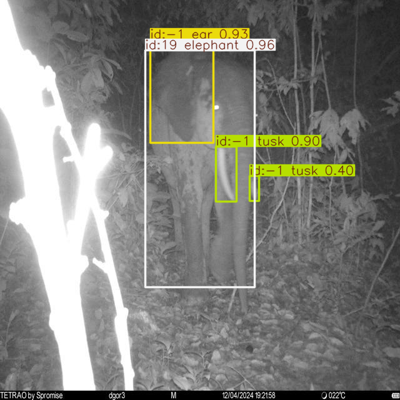

Detection boxes: [[     256.48      39.835      639.88      525.61     0.96046           2]
 [     507.01      251.85      559.29      353.58     0.93501           3]
 [     331.38      39.078         461       241.7     0.92952           1]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 3., 1.], dtype=torch.float64)
conf: tensor([0.9605, 0.9350, 0.9295], dtype=torch.float64)
data: tensor([[253.5036,  50.2328, 589.5290, 513.4572,  19.0000,   0.9605,   2.0000],
        [507.0062, 251.8509, 559.2913, 353.5757,  -1.0000,   0.9350,   3.0000],
        [331.3832,  39.0785, 461.0048, 241.7032,  -1.0000,   0.9295,   1.0000]], dtype=torch.float64)
id: tensor([19., -1., -1.], dtype=torch.float64)
is_track: True
orig_shape: (640, 640)
shape: torch.Size([3, 7])
xywh: tensor([[421.5163, 281.8450, 336.0254, 463.2243],
        [533.1487, 302.7133,  52.2850, 101.7247],
        [396.1940, 140.3909, 129.6216, 202.6247]])
xywhn: tensor([[0.6586, 0.4404, 0.5250, 0.7238],
     

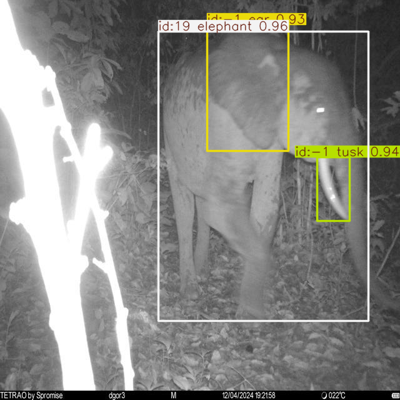

Detection boxes: [[     455.73       31.79         640      565.99     0.93853           2]]
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2.], dtype=torch.float64)
conf: tensor([0.9385], dtype=torch.float64)
data: tensor([[367.3093,  31.3844, 662.4346, 561.9392,  19.0000,   0.9385,   2.0000]], dtype=torch.float64)
id: tensor([19.], dtype=torch.float64)
is_track: True
orig_shape: (640, 640)
shape: torch.Size([1, 7])
xywh: tensor([[514.8719, 296.6618, 295.1253, 530.5548]])
xywhn: tensor([[0.8045, 0.4635, 0.4611, 0.8290]])
xyxy: tensor([[367.3093,  31.3844, 662.4346, 561.9392]], dtype=torch.float64)
xyxyn: tensor([[0.5739, 0.0490, 1.0351, 0.8780]], dtype=torch.float64)


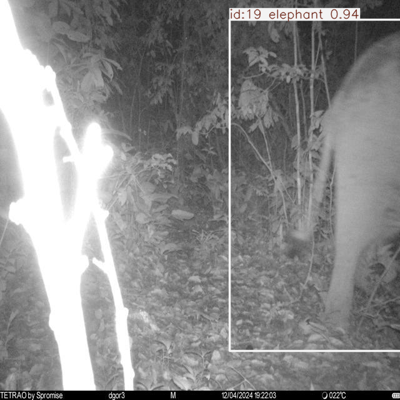

Detection boxes: [[          0      145.72      174.41      613.06     0.96877           2]
 [     307.69      209.27      497.86      441.86     0.95684           2]
 [     459.32      218.31      490.38       309.8     0.90225           1]
 [     88.478      147.05       146.7      337.63     0.87766           1]
 [     39.254      166.17      95.109      191.92     0.83127           1]
 [     107.45      308.06      247.06      517.26     0.82172           0]
 [     147.17      329.49      157.13      375.02     0.73847           3]]
No tracks
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 2., 1., 1., 1., 0., 3.])
conf: tensor([0.9688, 0.9568, 0.9023, 0.8777, 0.8313, 0.8217, 0.7385])
data: tensor([[  0.0000, 145.7200, 174.4052, 613.0552,   0.9688,   2.0000],
        [307.6934, 209.2690, 497.8559, 441.8575,   0.9568,   2.0000],
        [459.3203, 218.3144, 490.3840, 309.7983,   0.9023,   1.0000],
        [ 88.4784, 147.0515, 146.6972, 337.6329,   0.8777,  

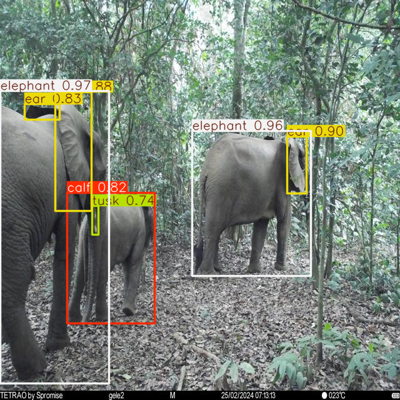

Detection boxes: [[     521.82      265.06       632.6      411.92     0.81209           2]
 [     410.27      236.81      637.52      414.11     0.73297           2]
 [     406.09      239.93      492.26      347.13     0.52494           2]]
No tracks
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 2., 2.])
conf: tensor([0.8121, 0.7330, 0.5249])
data: tensor([[5.2182e+02, 2.6506e+02, 6.3260e+02, 4.1192e+02, 8.1209e-01, 2.0000e+00],
        [4.1027e+02, 2.3681e+02, 6.3752e+02, 4.1411e+02, 7.3297e-01, 2.0000e+00],
        [4.0609e+02, 2.3993e+02, 4.9226e+02, 3.4713e+02, 5.2494e-01, 2.0000e+00]])
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([3, 6])
xywh: tensor([[577.2111, 338.4873, 110.7876, 146.8560],
        [523.8942, 325.4567, 227.2536, 177.2999],
        [449.1755, 293.5288,  86.1696, 107.2053]])
xywhn: tensor([[0.9019, 0.5289, 0.1731, 0.2295],
        [0.8186, 0.5085, 0.3551, 0.2770],
        [0.7018, 0.4586, 0.1346, 0.1675]])
xyxy: 

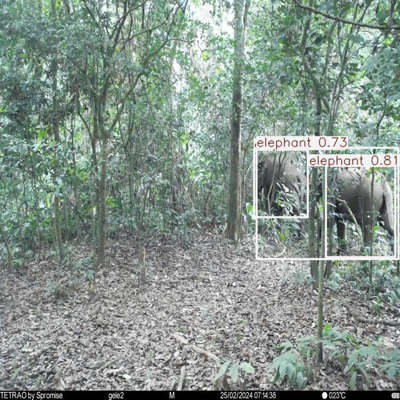

No detection
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([])
conf: tensor([])
data: tensor([], size=(0, 6))
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([0, 6])
xywh: tensor([], size=(0, 4))
xywhn: tensor([], size=(0, 4))
xyxy: tensor([], size=(0, 4))
xyxyn: tensor([], size=(0, 4))


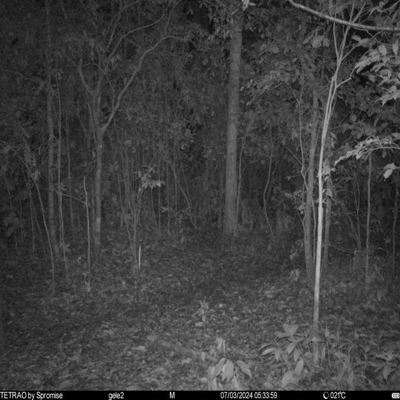

Detection boxes: [[     265.36      182.39      389.02      343.69     0.95503           1]
 [      194.2      155.75      500.08      606.64     0.95239           2]
 [     414.31      339.29      430.53      375.82     0.82563           3]]
No tracks
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([1., 2., 3.])
conf: tensor([0.9550, 0.9524, 0.8256])
data: tensor([[265.3606, 182.3893, 389.0215, 343.6936,   0.9550,   1.0000],
        [194.1992, 155.7523, 500.0768, 606.6445,   0.9524,   2.0000],
        [414.3101, 339.2931, 430.5261, 375.8182,   0.8256,   3.0000]])
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([3, 6])
xywh: tensor([[327.1910, 263.0414, 123.6609, 161.3043],
        [347.1380, 381.1984, 305.8777, 450.8922],
        [422.4181, 357.5556,  16.2161,  36.5251]])
xywhn: tensor([[0.5112, 0.4110, 0.1932, 0.2520],
        [0.5424, 0.5956, 0.4779, 0.7045],
        [0.6600, 0.5587, 0.0253, 0.0571]])
xyxy: tensor([[265.3606, 182.3893, 389.021

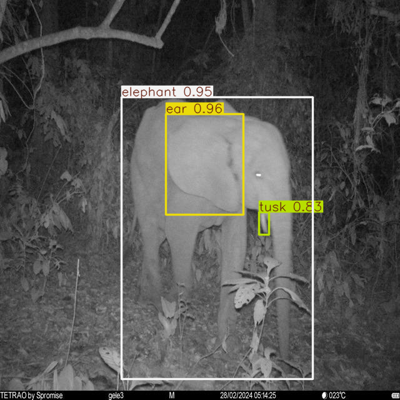

Detection boxes: [[     110.72      176.04      207.18      472.59     0.90108           2]
 [     181.32      298.05      197.03      403.92     0.85206           3]
 [     145.64      296.35      164.09      385.08      0.8511           3]]
No tracks
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([2., 3., 3.])
conf: tensor([0.9011, 0.8521, 0.8511])
data: tensor([[110.7212, 176.0377, 207.1762, 472.5918,   0.9011,   2.0000],
        [181.3159, 298.0479, 197.0317, 403.9213,   0.8521,   3.0000],
        [145.6428, 296.3492, 164.0937, 385.0767,   0.8511,   3.0000]])
id: None
is_track: False
orig_shape: (640, 640)
shape: torch.Size([3, 6])
xywh: tensor([[158.9487, 324.3148,  96.4550, 296.5541],
        [189.1738, 350.9846,  15.7159, 105.8734],
        [154.8682, 340.7130,  18.4509,  88.7275]])
xywhn: tensor([[0.2484, 0.5067, 0.1507, 0.4634],
        [0.2956, 0.5484, 0.0246, 0.1654],
        [0.2420, 0.5324, 0.0288, 0.1386]])
xyxy: tensor([[110.7212, 176.0377, 207.176

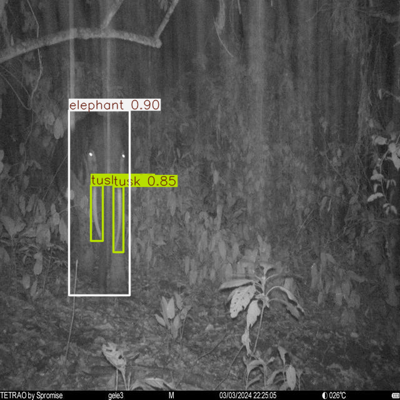

TypeError: postprocess_sqlite_data.<locals>._callback() missing 1 required positional argument: 'arg'

In [2]:
from ct_detector.model.ensemble import CtEnsembler
from ct_detector.model import MODELS, DATASETS, DATASETS_DIR
import os

# 1) Get a dataset
data_path = os.path.join(DATASETS_DIR, "1", "val.txt")  # or your dataset .yaml or folder of images

# 2) Create the ensemble
ensembler = CtEnsembler(
    model_paths=[MODELS['eie_t_1_yolov8m'], MODELS['eie_t_1_yolov9m']], # Specify a list of models
    predictor_overrides={"conf": 0.3, "save_txt": False, "verbose": False},  # e.g. no partial labels
)

# 3) Run predictions on a .txt of images with custom callbacks
gen = ensembler.predict(
    source=data_path,
    nms_iou_thres=0.5, # threshold for overlap during result merging
    nms_conf_thres=0.3, # threshold of conf considered during result merging
    class_agnostic=False, # whether to consider boxes of any class for merging in case of sufficient overlap or whether only consider same class
    class_merge_map={0:0, 1:1, 2:0, 3:2},  # Merge classes 0 and 2. Specify groups of classes that are together considered for merging.
    _callbacks=callbacks # A list of callback to execute after a result is merged.
)

# 5) For each merged frame, do more logic if you want
for idx, merged_frame in enumerate(gen):
    # Possibly do final .txt saving, or display bounding boxes
    # merged_frame.save_txt(f"ensemble_labels/frame_{idx}.txt")
    pass